# Zombie Detector

In this project we will create a Zombie detector using our own images. We scraped net for 20-30 images for training and testing, all based on Walking Dead Series and some similar CG  generated ones. Goal is to create a competetent Zombie detector pipeline. For annotation, we used Makesense AI and exported both in xyxy format and yolo format.

We tested both YoloV8 and RetinaNet models across many backbone models in Keras, we obtained best performance in RetinaNet model with ResNet-101 as backbone, with it we got a very decent zombie detector which we can train futher with more images.

## Data Preparation and Basic EDA

In [1]:
import tensorflow as tf
import keras_cv
from PIL import Image
from IPython.display import display
import pandas as pd
import numpy as np
from plot_keras_history import show_history
import matplotlib.pyplot as plt
import math

2025-09-22 18:38:58.843071: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-22 18:38:58.963582: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-09-22 18:39:00.447134: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


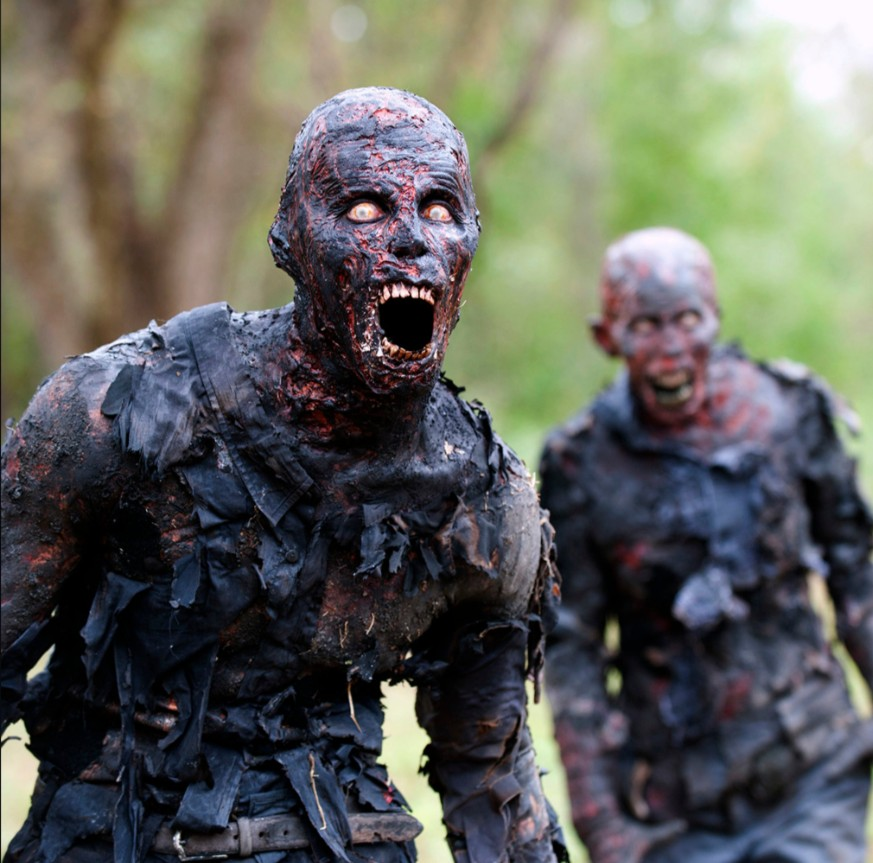

In [2]:
#sample zombie image

display(Image.open('train_zom/1.jpg'))

In [3]:
bbox_df = pd.read_csv('final_labels.csv')

In [4]:
labels = ['zombie', 'human'] #based on integers mapping in yolo based bbox marking

In [5]:
bbox_df.head()

,image_name,x1,y1,x2,y2,label_name
0,1.jpg,3,81,551,863,zombie
1,1.jpg,530,220,870,863,zombie
2,11.jpg,469,678,617,952,human
3,11.jpg,1211,675,1397,952,human
4,12.jpg,583,222,1028,930,zombie


In [6]:
bbox_df['image_name'] = bbox_df['image_name'].map(lambda row: 'test_zom/' + row if '_t' in row else 'train_zom/' + row)
bbox_df['class_id'] = bbox_df['label_name'].map({label:idx for idx, label in enumerate(labels)})

In [7]:
bbox_df.columns = ['path', 'x1', 'y1', 'x2', 'y2', 'label', 'class_id']
bbox_df.head()

,path,x1,y1,x2,y2,label,class_id
0,train_zom/1.jpg,3,81,551,863,zombie,0
1,train_zom/1.jpg,530,220,870,863,zombie,0
2,train_zom/11.jpg,469,678,617,952,human,1
3,train_zom/11.jpg,1211,675,1397,952,human,1
4,train_zom/12.jpg,583,222,1028,930,zombie,0


In [8]:
bbox_df['class_id'] = bbox_df['class_id'].astype(np.float32)

In [9]:
train_df = bbox_df[bbox_df['path'].str.contains('train_zom/')]
test_df = bbox_df[bbox_df['path'].str.contains('test_zom/')]

In [10]:
test_df.head()

,path,x1,y1,x2,y2,label,class_id
62,test_zom/1_t.jpg,124,0,958,574,zombie,0.0
63,test_zom/2_t.jpg,579,39,1097,892,zombie,0.0
64,test_zom/2_t.jpg,229,169,586,892,zombie,0.0
65,test_zom/2_t.jpg,1203,228,1509,892,zombie,0.0
66,test_zom/2_t.jpg,6,107,235,892,zombie,0.0


In [11]:
grouped_train = train_df.groupby('path')
grouped_test = test_df.groupby('path')

In [12]:
records_train = []
for img_path, group in grouped_train:
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class_id'].values
    records_train.append((img_path, boxes, classes))

records_test = []
for img_path, group in grouped_test:
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class_id'].values
    records_test.append((img_path, boxes, classes))

In [13]:
records_train[0]

('train_zom/1.jpg',
 array([[  3,  81, 551, 863],
        [530, 220, 870, 863]]),
 array([0., 0.], dtype=float32))

In [14]:
TARGET_SIZE = (512, 512)
MAX_BOXES = 5
BATCH_SIZE = 4

resize = keras_cv.layers.Resizing(*TARGET_SIZE)
rescale = keras_cv.layers.Rescaling(1./255)

def load_and_preprocess(img_path, boxes, classes):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img.set_shape([None, None, 3])
    orig_shape = tf.shape(img)[:2]  # [H, W]

    # Resize + rescale to match training input
    img = resize(img)
    img = rescale(img)

    # Scale given xyxy pixel boxes from original -> resized, then normalize to [0,1]
    boxes = tf.cast(boxes, tf.float32)
    h_scale = tf.cast(TARGET_SIZE[0], tf.float32) / tf.cast(orig_shape[0], tf.float32)
    w_scale = tf.cast(TARGET_SIZE[1], tf.float32) / tf.cast(orig_shape[1], tf.float32)
    boxes = tf.stack([
        boxes[:, 0] * w_scale,  # x1
        boxes[:, 1] * h_scale,  # y1
        boxes[:, 2] * w_scale,  # x2
        boxes[:, 3] * h_scale,  # y2
    ], axis=1)
    boxes = boxes / [TARGET_SIZE[1], TARGET_SIZE[0], TARGET_SIZE[1], TARGET_SIZE[0]]
    boxes = tf.clip_by_value(boxes, 0.0, 1.0)  # important on tiny data

    # Enforce MAX_BOXES so padded_batch shapes are valid
    boxes = boxes[:MAX_BOXES]
    classes = tf.cast(classes[:MAX_BOXES], tf.float32)  # keep float padding compatible

    return {
        "images": img,
        "bounding_boxes": {
            "boxes": boxes,
            "classes": classes,
        },
    }

I0000 00:00:1758546547.925320  138893 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5561 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


In [15]:
def generator_train():
    for img_path, group in grouped_train:
        boxes = group[['x1', 'y1', 'x2', 'y2']].values
        classes = group['class_id'].values
        yield img_path, boxes, classes

def generator_test():
    for img_path, group in grouped_test:
        boxes = group[['x1', 'y1', 'x2', 'y2']].values
        classes = group['class_id'].values
        yield img_path, boxes, classes

output_signature = (
    tf.TensorSpec(shape=(), dtype=tf.string),
    tf.TensorSpec(shape=(None, 4), dtype=tf.float32),
    tf.TensorSpec(shape=(None,), dtype=tf.int32),
)

# Train dataset
dataset_train = tf.data.Dataset.from_generator(generator_train, output_signature=output_signature)
dataset_train = dataset_train.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)

dataset_train = dataset_train.padded_batch(
    batch_size=BATCH_SIZE,
    padding_values={"images": 0.0, "bounding_boxes": {"boxes": 0.0, "classes": -1.0}},
    padded_shapes={"images": [*TARGET_SIZE, 3],
                   "bounding_boxes": {"boxes": [MAX_BOXES, 4], "classes": [MAX_BOXES]}},
)

# Test dataset 
dataset_test = tf.data.Dataset.from_generator(generator_test, output_signature=output_signature)
dataset_test = dataset_test.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
dataset_test = dataset_test.padded_batch(
    batch_size=BATCH_SIZE,
    padding_values={"images": 0.0, "bounding_boxes": {"boxes": 0.0, "classes": -1.0}},
    padded_shapes={"images": [*TARGET_SIZE, 3],
                   "bounding_boxes": {"boxes": [MAX_BOXES, 4], "classes": [MAX_BOXES]}},
).prefetch(tf.data.AUTOTUNE)

steps_per_epoch = math.ceil(len(records_train) / BATCH_SIZE)
val_steps = math.ceil(len(records_test) / BATCH_SIZE)


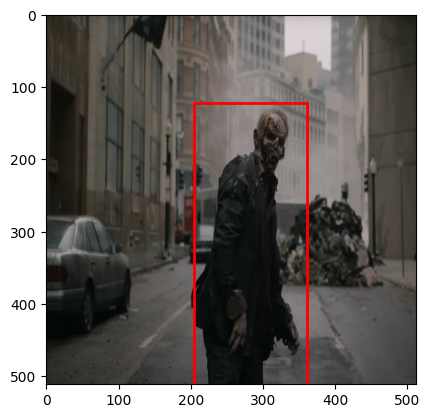

Classes: [ 0. -1. -1. -1. -1.]


In [16]:
import matplotlib.pyplot as plt

def show_sample(dataset):
    for batch in dataset.take(1):
        img = batch['images'][2].numpy()  # Take first image in batch
        boxes = batch['bounding_boxes']['boxes'][2].numpy()
        classes = batch['bounding_boxes']['classes'][2].numpy()
        plt.imshow(img)
        for box in boxes:
            x1, y1, x2, y2 = box
            plt.gca().add_patch(
                plt.Rectangle((x1*img.shape[1], y1*img.shape[0]),
                              (x2-x1)*img.shape[1], (y2-y1)*img.shape[0],
                              fill=False, edgecolor='red', linewidth=2)
            )
        plt.show()
        print("Classes:", classes)
        break

show_sample(dataset_train)


In [17]:
augmenter = keras_cv.layers.Augmenter([
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="rel_xyxy"),
    keras_cv.layers.RandomRotation(factor=0.1, bounding_box_format= 'rel_xyxy'),
])

def preprocess_with_augmentation(inputs):
    return augmenter(inputs)

dataset_aug = dataset_train.map(preprocess_with_augmentation, num_parallel_calls=tf.data.AUTOTUNE)

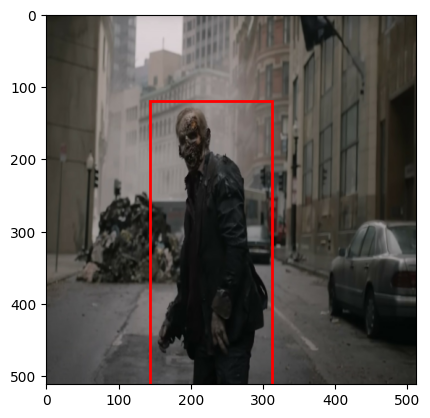

Classes: [0.]


In [18]:
#testing augmented dataset sample

show_sample(dataset_aug)

In [19]:
# Creating Train dataset again with augmentation

dataset_train = tf.data.Dataset.from_generator(generator_train, output_signature=output_signature)
dataset_train = dataset_train.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)

augment = tf.keras.Sequential([
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="rel_xyxy"),
    keras_cv.layers.RandomRotation(factor=0.2, bounding_box_format= 'rel_xyxy'),
])
def apply_aug(sample):
    return {"images": augment(sample["images"]),
            "bounding_boxes": sample["bounding_boxes"]}

dataset_train = dataset_train.map(apply_aug, num_parallel_calls=tf.data.AUTOTUNE)

dataset_train = dataset_train.shuffle(256).padded_batch(
    batch_size=BATCH_SIZE,
    padding_values={"images": 0.0, "bounding_boxes": {"boxes": 0.0, "classes": -1.0}},
    padded_shapes={"images": [*TARGET_SIZE, 3],
                   "bounding_boxes": {"boxes": [MAX_BOXES, 4], "classes": [MAX_BOXES]}},
).repeat().prefetch(tf.data.AUTOTUNE)

At this stage we have prepared both augmented and non augmented dataset for training.

## Model Training And Evaluation

In [43]:
print(model.presets.keys())

dict_keys(['resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152', 'resnet18_v2', 'resnet34_v2', 'resnet50_v2', 'resnet101_v2', 'resnet152_v2', 'mobilenet_v3_small', 'mobilenet_v3_large', 'csp_darknet_tiny', 'csp_darknet_s', 'csp_darknet_m', 'csp_darknet_l', 'csp_darknet_xl', 'efficientnetv1_b0', 'efficientnetv1_b1', 'efficientnetv1_b2', 'efficientnetv1_b3', 'efficientnetv1_b4', 'efficientnetv1_b5', 'efficientnetv1_b6', 'efficientnetv1_b7', 'efficientnetv2_s', 'efficientnetv2_m', 'efficientnetv2_l', 'efficientnetv2_b0', 'efficientnetv2_b1', 'efficientnetv2_b2', 'efficientnetv2_b3', 'densenet121', 'densenet169', 'densenet201', 'efficientnetlite_b0', 'efficientnetlite_b1', 'efficientnetlite_b2', 'efficientnetlite_b3', 'efficientnetlite_b4', 'yolo_v8_xs_backbone', 'yolo_v8_s_backbone', 'yolo_v8_m_backbone', 'yolo_v8_l_backbone', 'yolo_v8_xl_backbone', 'vitdet_base', 'vitdet_large', 'vitdet_huge', 'videoswin_tiny', 'videoswin_small', 'videoswin_base', 'resnet50_imagenet', 'resnet50_v

In [81]:
# we checked multiple backbones including efficientnet, densenet and many others, best performanc was with resnet101

NUM_CLASSES = 2

model = keras_cv.models.RetinaNet.from_preset(
    "resnet101",
    bounding_box_format="rel_xyxy",
    weights="coco",
    num_classes=NUM_CLASSES
)

# freeze backbone, train heads
model.backbone.trainable = False
model.compile(
    classification_loss="focal",
    box_loss="smoothl1",
    optimizer=tf.keras.optimizers.Adam(1e-4)
)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_box_loss", mode = 'min', factor=0.5, patience=3, cooldown=1, min_lr=1e-6, verbose=1
)
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_box_loss", mode = 'min', patience=8, restore_best_weights=True, verbose=1
)

hist1 = model.fit(
    dataset_train,
    epochs=20, 
    steps_per_epoch=steps_per_epoch,
    validation_data=dataset_test,
    validation_steps=val_steps,
    callbacks=[reduce_lr],
)

100%|██████████████████████████████████████████████████████████████████████████████████| 762/762 [00:00<00:00, 1.32MB/s]


Epoch 1/20


/home/anubh/miniconda3/envs/dl-env/lib/python3.11/site-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - box_loss: 0.7405 - classification_loss: 1.1292 - loss: 1.8697

/home/anubh/miniconda3/envs/dl-env/lib/python3.11/site-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


6/6 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - box_loss: 0.7384 - classification_loss: 1.1290 - loss: 1.8673 - val_box_loss: 0.7337 - val_classification_loss: 1.1279 - val_loss: 1.8462 - learning_rate: 1.0000e-04
Epoch 2/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - box_loss: 0.7384 - classification_loss: 1.1269 - loss: 1.8653 - val_box_loss: 0.7316 - val_classification_loss: 1.1237 - val_loss: 1.8405 - learning_rate: 1.0000e-04
Epoch 3/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - box_loss: 0.7255 - classification_loss: 1.1156 - loss: 1.8410 - val_box_loss: 0.7220 - val_classification_loss: 1.1018 - val_loss: 1.8128 - learning_rate: 1.0000e-04
Epoch 4/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - box_loss: 0.7067 - classification_loss: 1.0647 - loss: 1.7714 - val_box_loss: 0.6884 - val_classification_loss: 0.9935 - val_loss: 1.6878 - learning_rate: 1.0000e-04
Epoch 5/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - box_loss: 0.6628 - classification_loss: 0.8967 - loss: 1.5595 - val_box_loss: 0.6802 - va

In [82]:
model.summary()

Model: "retina_net_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ images (InputLayer) │ (None, None,      │          0 │ -                 │
│                     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_6        │ [(None, None,     │ 42,605,504 │ images[0][0]      │
│ (Functional)        │ None, 512),       │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 1024),      │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 2048)]      │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ feature_pyramid_5   │ [(None, None,     │  7,997,440 │ functional_6[0][… │
│ (FeaturePyramid)    │ None, 256),       │            │ functional_6[0][… │
│                     │ (None, None,      │            │ functional_6[0][… │
│                     │ None, 256),       │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 256),       │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 256),       │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 256)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ prediction_head_11  │ (None, None,      │  1,853,220 │ feature_pyramid_… │
│ (PredictionHead)    │ None, 36)         │            │ feature_pyramid_… │
│                     │                   │            │ feature_pyramid_… │
│                     │                   │            │ feature_pyramid_… │
│                     │                   │            │ feature_pyramid_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ prediction_head_10  │ (None, None,      │  1,811,730 │ feature_pyramid_… │
│ (PredictionHead)    │ None, 18)         │            │ feature_pyramid_… │
│                     │                   │            │ feature_pyramid_… │
│                     │                   │            │ feature_pyramid_… │
│                     │                   │            │ feature_pyramid_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_50          │ (None, None, 4)   │          0 │ prediction_head_… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_52          │ (None, None, 4)   │          0 │ prediction_head_… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_54          │ (None, None, 4)   │          0 │ prediction_head_… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_56          │ (None, None, 4)   │          0 │ prediction_head_… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_58          │ (None, None, 4)   │          0 │ prediction_head_… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_51          │ (None, None, 2)   │          0 │ prediction_head_

 Total params: 77,592,676 (295.99 MB)

 Trainable params: 11,662,390 (44.49 MB)

 Non-trainable params: 42,605,504 (162.53 MB)

 Optimizer params: 23,324,782 (88.98 MB)

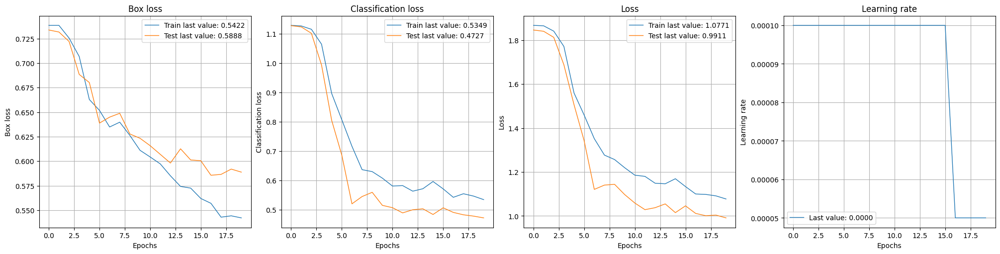

In [83]:
show_history(hist1)

In [86]:
def unfreeze_last_resnet_stage(backbone):
    for l in backbone.layers:
        if "v2_stack_3_" in l.name:
            l.trainable = True
        if isinstance(l, tf.keras.layers.BatchNormalization):
            l.trainable = False

unfreeze_last_resnet_stage(model.backbone)

model.compile(
    classification_loss="focal",
    box_loss="smoothl1",
    optimizer=tf.keras.optimizers.AdamW(3e-5, weight_decay=1e-5),
)

hist2 = model.fit(
    dataset_train,
    initial_epoch=20,
    epochs=50, 
    steps_per_epoch=steps_per_epoch,
    validation_data=dataset_test,
    validation_steps=val_steps,
    callbacks=[reduce_lr, early_stopping],
)


Epoch 21/50


/home/anubh/miniconda3/envs/dl-env/lib/python3.11/site-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - box_loss: 0.5427 - classification_loss: 0.5634 - loss: 1.1061

/home/anubh/miniconda3/envs/dl-env/lib/python3.11/site-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


6/6 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - box_loss: 0.5453 - classification_loss: 0.5697 - loss: 1.1150 - val_box_loss: 0.5876 - val_classification_loss: 0.5067 - val_loss: 1.0426 - learning_rate: 3.0000e-05
Epoch 22/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - box_loss: 0.5371 - classification_loss: 0.5534 - loss: 1.0906 - val_box_loss: 0.5899 - val_classification_loss: 0.4755 - val_loss: 0.9996 - learning_rate: 3.0000e-05
Epoch 23/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - box_loss: 0.5373 - classification_loss: 0.5498 - loss: 1.0870
Epoch 23: ReduceLROnPlateau reducing learning rate to 1.4999999621068127e-05.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - box_loss: 0.5507 - classification_loss: 0.5405 - loss: 1.0912 - val_box_loss: 0.5925 - val_classification_loss: 0.4833 - val_loss: 1.0020 - learning_rate: 3.0000e-05
Epoch 24/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - box_loss: 0.5320 - classification_loss: 0.5404 - loss: 1.0724 - val_box_loss: 0.5911 - val_classification_loss: 0.4815 - va

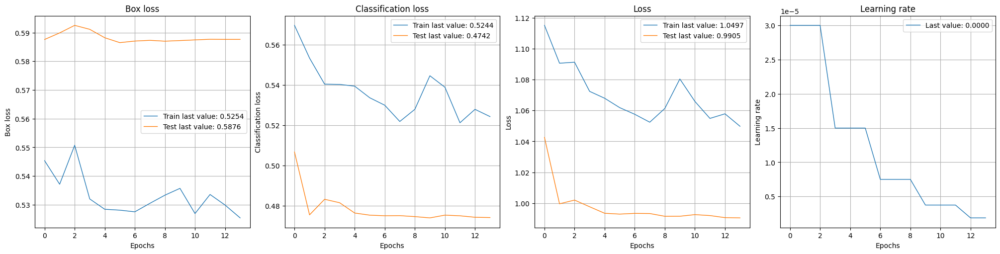

In [87]:
show_history(hist2)

In [88]:
test_metrics = model.evaluate(dataset_test, steps=val_steps, verbose=1)
print(dict(zip(model.metrics_names, test_metrics)))

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - box_loss: 0.5865 - classification_loss: 0.4754 - loss: 0.9929 
{'loss': 0.9929410815238953, 'box_loss': 0.58649742603302, 'classification_loss': 0.4753676652908325}


Model was based on coco weights which is also an object detection dataset, so we trained our heads first and then after warmup trained last resnet layers for further finetuning. We could also use LoRA finetuning instead.

In [89]:
# model.save('zombie_detector_res_101.keras')

In [33]:
def nms_per_class_rel_xyxy(boxes_rel, classes, scores, iou_th=0.6, max_det=100):
    # boxes_rel: (N,4) in rel_xyxy, classes: (N,), scores: (N,)
    # Returns filtered arrays with NMS applied per class.
    boxes_rel = np.asarray(boxes_rel, dtype=np.float32)
    classes = np.asarray(classes, dtype=np.int32)
    scores = np.asarray(scores, dtype=np.float32)

    out_boxes, out_classes, out_scores = [], [], []
    for cid in np.unique(classes):
        inds = np.where(classes == cid)[0]
        if inds.size == 0:
            continue
        b = tf.convert_to_tensor(boxes_rel[inds], tf.float32)
        s = tf.convert_to_tensor(scores[inds], tf.float32)

        # tf.image.non_max_suppression expects absolute coords but uses only relative IoU geometry,
        # so using rel_xyxy is fine; max_output_size caps selected number per class
        keep = tf.image.non_max_suppression(
            boxes=b,
            scores=s,
            max_output_size=int(max_det),
            iou_threshold=float(iou_th),
            score_threshold=float(-1.0),  # we already filtered by score elsewhere
        )
        keep = keep.numpy()
        out_boxes.append(boxes_rel[inds][keep])
        out_classes.append(classes[inds][keep])
        out_scores.append(scores[inds][keep])

    if len(out_boxes) == 0:
        return np.empty((0,4), np.float32), np.empty((0,), np.int32), np.empty((0,), np.float32)
    return np.vstack(out_boxes), np.concatenate(out_classes), np.concatenate(out_scores)


def predict_img(image_path, model, score_th=0.5, iou_th=0.6,
                class_names=("zombie","human"), show=True):
    # 1) Load + preprocess
    img_bytes = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img_bytes, channels=3)
    H, W = int(img.shape[0]), int(img.shape[1])
    x = rescale(resize(img))[None, ...]

    # 2) Make decoder permissive so we get many boxes; we'll NMS ourselves
    dec = getattr(model, "prediction_decoder", None)
    if dec is not None:
        for attr, val in [("confidence_threshold", 0.0),
                          ("pad_to_max_detections", False)]:
            if hasattr(dec, attr):
                try: setattr(dec, attr, val)
                except: pass

    # 3) Predict
    p = model.predict(x, verbose=0)

    # 4) Extract single-image arrays
    if isinstance(p["classes"], (tf.Tensor, np.ndarray)):  # dense padded
        c = p["classes"][0]; s = p["confidence"][0]; b = p["boxes"][0]
        if isinstance(c, tf.Tensor): c = c.numpy()
        if isinstance(s, tf.Tensor): s = s.numpy()
        if isinstance(b, tf.Tensor): b = b.numpy()
        valid = (c != -1)
        c, s, b = c[valid].astype(int), s[valid], b[valid]
    else:  # ragged
        c = p["classes"][0].numpy().astype(int)
        s = p["confidence"][0].numpy()
        b = p["boxes"][0].numpy()

    # 5) Score filtering first
    keep = s >= score_th
    b, c, s = b[keep], c[keep], s[keep]

    # 6) Apply our own IoU NMS per class (in rel_xyxy)
    b, c, s = nms_per_class_rel_xyxy(b, c, s, iou_th=iou_th, max_det=100)

    # 7) Clip and convert rel_xyxy -> pixel xyxy
    b = np.clip(b, 0.0, 1.0)
    b[:, [0,2]] *= W
    b[:, [1,3]] *= H
    b = b.astype(int)

    # 8) Visualize
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.imshow(img.numpy()); ax.axis("off")
        for (x1, y1, x2, y2), cid, sc in zip(b, c, s):
            ax.add_patch(plt.Rectangle((x1, y1), max(1, x2-x1), max(1, y2-y1),
                                       fill=False, edgecolor="lime", linewidth=2))
            name = class_names[cid] if (class_names and 0 <= cid < len(class_names)) else str(cid)
            ax.text(x1, max(10, y1-3), f"{name} {sc:.2f}",
                    bbox=dict(facecolor="lime", alpha=0.6, edgecolor="none"),
                    color="black", fontsize=10)
        plt.show()

    return b, c, s


/home/anubh/miniconda3/envs/dl-env/lib/python3.11/site-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(1, 512, 512, 3))
  warnings.warn(msg)
2025-09-22 14:26:40.867963: I external/local_xla/xla/service/service.cc:163] XLA service 0x32fee4b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-09-22 14:26:40.868016: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9
2025-09-22 14:26:41.065981: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-09-22 14:26:41.999573: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 90501
I0000 00:00:1758531407.368491   64123 device_compiler.h:196] Compil

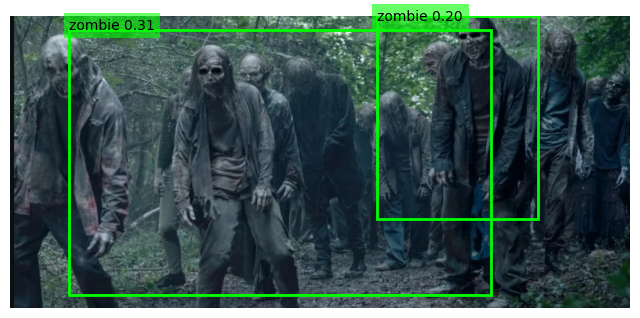

(array([[ 128,   32, 1043,  607],
        [ 797,    0, 1145,  442]]),
 array([0, 0], dtype=int32),
 array([0.312648  , 0.20112538], dtype=float32))

In [23]:
predict_img("new_t1.jpg", model, score_th=0.2, iou_th=0.2)

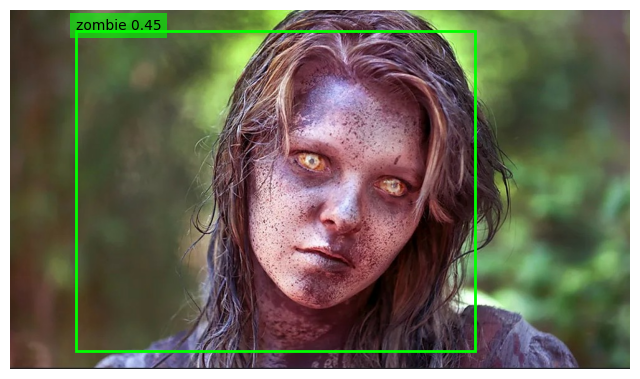

(array([[105,  34, 747, 548]]),
 array([0], dtype=int32),
 array([0.45493647], dtype=float32))

In [24]:
predict_img("test_zom/1_t.jpg", model, score_th=0.4)

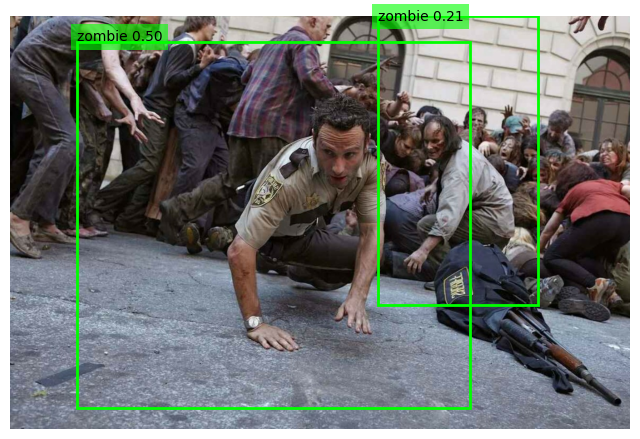

(array([[ 139,   55,  959,  817],
        [ 766,    0, 1100,  602]]),
 array([0, 0], dtype=int32),
 array([0.4956378, 0.2122229], dtype=float32))

In [25]:
predict_img("test_zom/5_t.jpg", model, score_th=0.2, iou_th=0.2)

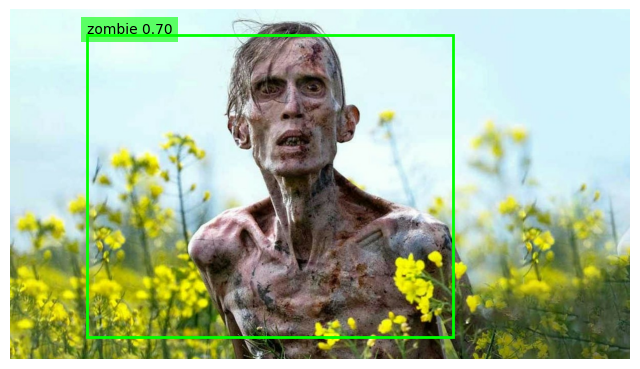

(array([[150,  50, 870, 644]]),
 array([0], dtype=int32),
 array([0.70278066], dtype=float32))

In [26]:
predict_img("test_zom/3_t.jpg", model, score_th=0.6, iou_th= 0.2)

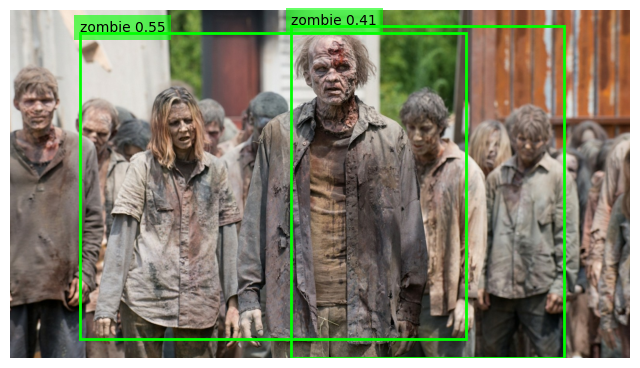

(array([[ 178,   59, 1167,  843],
        [ 720,   41, 1418,  892]]),
 array([0, 0], dtype=int32),
 array([0.55129975, 0.41485858], dtype=float32))

In [27]:
predict_img("test_zom/2_t.jpg", model, score_th=0.4, iou_th=0.48)

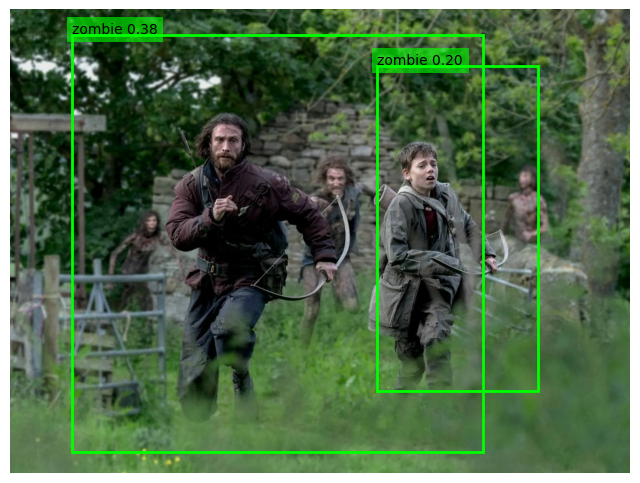

(array([[ 119,   49,  908,  851],
        [ 706,  109, 1014,  734]]),
 array([0, 0], dtype=int32),
 array([0.3771122 , 0.20411614], dtype=float32))

In [28]:
predict_img("test_zom/4_t.jpg", model, score_th=0.2, iou_th=0.2)

From the visual inspection and also based on the scores we can see that while zombie detector is working really well on test images, our attempt to create a human/zombie detector with 20-30 images is not a valid approach, we need around 50 samples for each class and some samples having both of them, while we indeed used such samples our training size is not enough for human detection.

Nevertheless it is able to detect bipedal creatures, and can be used in zombie detection in wild, all achieved with only a few training images.

In [21]:
# YOLOv8 detector, again we tested many backbones, best one was again resnet 101
model_yolo = keras_cv.models.YOLOV8Detector.from_preset(
    "resnet101",
    num_classes = 2,
    bounding_box_format = "rel_xyxy",
    weights = 'coco'
)

model_yolo.backbone.trainable = False

In [71]:
model_yolo.presets.keys()

dict_keys(['resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152', 'resnet18_v2', 'resnet34_v2', 'resnet50_v2', 'resnet101_v2', 'resnet152_v2', 'mobilenet_v3_small', 'mobilenet_v3_large', 'csp_darknet_tiny', 'csp_darknet_s', 'csp_darknet_m', 'csp_darknet_l', 'csp_darknet_xl', 'efficientnetv1_b0', 'efficientnetv1_b1', 'efficientnetv1_b2', 'efficientnetv1_b3', 'efficientnetv1_b4', 'efficientnetv1_b5', 'efficientnetv1_b6', 'efficientnetv1_b7', 'efficientnetv2_s', 'efficientnetv2_m', 'efficientnetv2_l', 'efficientnetv2_b0', 'efficientnetv2_b1', 'efficientnetv2_b2', 'efficientnetv2_b3', 'densenet121', 'densenet169', 'densenet201', 'efficientnetlite_b0', 'efficientnetlite_b1', 'efficientnetlite_b2', 'efficientnetlite_b3', 'efficientnetlite_b4', 'yolo_v8_xs_backbone', 'yolo_v8_s_backbone', 'yolo_v8_m_backbone', 'yolo_v8_l_backbone', 'yolo_v8_xl_backbone', 'vitdet_base', 'vitdet_large', 'vitdet_huge', 'videoswin_tiny', 'videoswin_small', 'videoswin_base', 'resnet50_imagenet', 'resnet50_v

In [22]:
model_yolo.summary()

Model: "yolov8_detector"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_2        │ [(None, None,     │ 42,605,504 │ input_layer_3[0]… │
│ (Functional)        │ None, 512),       │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 1024),      │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 2048)]      │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat (Repeat)     │ (None, None,      │          0 │ functional_2[0][… │
│                     │ None, 2048)       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_1 (Repeat)   │ (None, None,      │          0 │ repeat[0][0]      │
│                     │ None, 2048)       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, None,      │          0 │ repeat_1[0][0],   │
│ (Concatenate)       │ None, 3072)       │            │ functional_2[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_co… │ (None, None,      │  3,145,728 │ concatenate[0][0] │
│ (Conv2D)            │ None, 1024)       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_bn  │ (None, None,      │      4,096 │ pa_fpn_p4p5_pre_… │
│ (BatchNormalizatio… │ None, 1024)       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre     │ (None, None,      │          0 │ pa_fpn_p4p5_pre_… │
│ (Activation)        │ None, 1024)       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ split (Split)       │ [(None, None,     │          0 │ pa_fpn_p4p5_pre[… │
│                     │ None, 512),       │            │                   │
│                     │ (None, None,      │            │                   │
│                     │ None, 512)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │          0 │ split[0][1]       │
│ (ZeroPadding2D)     │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │  2,359,296 │ pa_fpn_p4p5_pre_… │
│ (Conv2D)            │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │      2,048 │ pa_fpn_p4p5_pre_… │
│ (BatchNormalizatio… │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_1 │ (None, None,      │          0 │ pa_fpn_p4p5_pre_… │
│ (Activation)        │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │          0 │ pa_fpn_p4p5_pre_… │
│ (ZeroPadding2D)     │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pa_fpn_p4p5_pre_0_… │ (None, None,      │  2,359,296 │ pa_fpn_p4p5_pre_

 Total params: 166,575,238 (635.43 MB)

 Trainable params: 123,922,118 (472.73 MB)

 Non-trainable params: 42,653,120 (162.71 MB)

In [23]:
model_yolo.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
                  box_loss = 'ciou',
                  classification_loss= 'binary_crossentropy'
                  )

history_yolo_1 = model_yolo.fit(
    dataset_train, 
    epochs = 20,
    steps_per_epoch = steps_per_epoch,
    validation_data = dataset_test,
    validation_steps = val_steps,
)

Epoch 1/20


2025-09-22 18:40:08.311908: I external/local_xla/xla/service/service.cc:163] XLA service 0x18f9ebc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-09-22 18:40:08.311948: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9
2025-09-22 18:40:08.920371: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-09-22 18:40:12.321309: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 90501
I0000 00:00:1758546641.553362  139034 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


6/6 ━━━━━━━━━━━━━━━━━━━━ 66s 3s/step - box_loss: 3.9786 - class_loss: 182.8108 - loss: 186.7894 - val_box_loss: 3.7988 - val_class_loss: 176.7475 - val_loss: 208.0711
Epoch 2/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 379ms/step - box_loss: 3.7204 - class_loss: 111.2745 - loss: 114.9949 - val_box_loss: 3.6919 - val_class_loss: 176.7260 - val_loss: 209.0774
Epoch 3/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 381ms/step - box_loss: 3.3145 - class_loss: 82.4034 - loss: 85.7179 - val_box_loss: 3.5304 - val_class_loss: 166.9247 - val_loss: 198.6753
Epoch 4/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 378ms/step - box_loss: 3.2017 - class_loss: 60.5243 - loss: 63.7260 - val_box_loss: 3.3244 - val_class_loss: 158.1972 - val_loss: 189.2307
Epoch 5/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 378ms/step - box_loss: 2.9587 - class_loss: 53.1014 - loss: 56.0602 - val_box_loss: 3.0809 - val_class_loss: 133.3300 - val_loss: 160.4060
Epoch 6/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 379ms/step - box_loss: 2.9468 - class_loss: 54.8244 - loss: 57.7712 - val_box_lo

In [24]:
early_stopping_yolo = tf.keras.callbacks.EarlyStopping(
    patience= 10,
    monitor = 'val_box_loss',
    mode = 'min',
    restore_best_weights = True,
    start_from_epoch = 30
)

In [27]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(patience= 4, monitor= 'val_box_loss', factor = 0.5, mode=  'min')

In [28]:
def unfreeze_last_yolo_backbone_layer(backbone):
    for l in backbone.layers:
        if "v2_stack_3" in l.name:
            l.trainable = True
        if isinstance(l, tf.keras.layers.BatchNormalization):
            l.trainable = False

unfreeze_last_yolo_backbone_layer(model_yolo.backbone)

model_yolo.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
    optimizer=tf.keras.optimizers.AdamW(3e-5, weight_decay=1e-5),
)

history_yolo_2 = model_yolo.fit(
    dataset_train,
    initial_epoch = 20,
    epochs = 60, 
    steps_per_epoch = steps_per_epoch,
    validation_data = dataset_test,
    validation_steps = val_steps,
    callbacks = [reduce_lr, early_stopping_yolo]
)


Epoch 21/60
6/6 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - box_loss: 2.4419 - class_loss: 24.3474 - loss: 26.7893 - val_box_loss: 2.2428 - val_class_loss: 28.8857 - val_loss: 37.0358 - learning_rate: 3.0000e-05
Epoch 22/60
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 409ms/step - box_loss: 2.5466 - class_loss: 22.7204 - loss: 25.2671 - val_box_loss: 2.3428 - val_class_loss: 25.7713 - val_loss: 33.4350 - learning_rate: 3.0000e-05
Epoch 23/60
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 404ms/step - box_loss: 2.5695 - class_loss: 22.7770 - loss: 25.3465 - val_box_loss: 2.3693 - val_class_loss: 26.5734 - val_loss: 34.1385 - learning_rate: 3.0000e-05
Epoch 24/60
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 406ms/step - box_loss: 2.4299 - class_loss: 21.2441 - loss: 23.6740 - val_box_loss: 2.4934 - val_class_loss: 24.4453 - val_loss: 31.2156 - learning_rate: 3.0000e-05
Epoch 25/60
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 402ms/step - box_loss: 2.4104 - class_loss: 21.2191 - loss: 23.6296 - val_box_loss: 2.6153 - val_class_loss: 21.4978 - val_loss: 26.9743 - lea

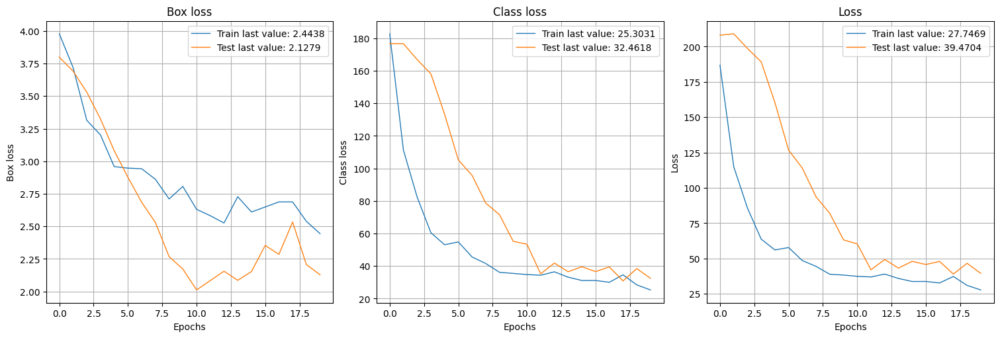

In [29]:
show_history(history_yolo_1)

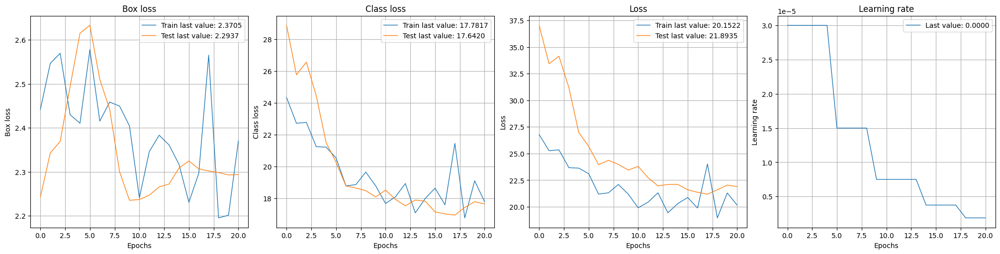

In [30]:
show_history(history_yolo_2)

In [31]:
test_metrics = model_yolo.evaluate(dataset_test, steps=val_steps, verbose=1)
print(dict(zip(model_yolo.metrics_names, test_metrics)))

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - box_loss: 2.2370 - class_loss: 18.5086 - loss: 23.7958
{'loss': 23.795764923095703, 'box_loss': 2.2369799613952637, 'class_loss': 18.508617401123047}


While loss across them are not comparable as both models use different methods to compute them, we can nevertheless observe that classification loss is huge compared to box regression loss, in RetinaNet both were similar in values. This reflects that even after reaching the plateau yolo classification loss may tell us that it will not work so well.

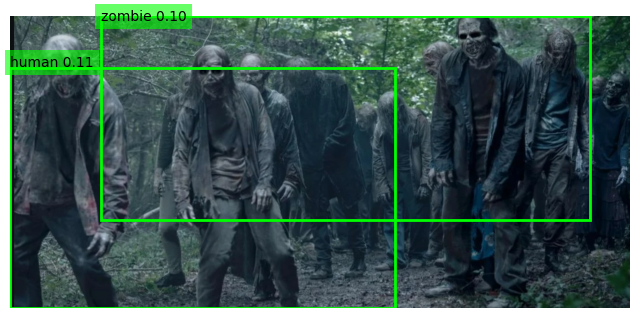

(array([[ 197,    0, 1259,  444],
        [   0,  113,  835,  635]]),
 array([0, 1], dtype=int32),
 array([0.10188986, 0.10957351], dtype=float32))

In [36]:
predict_img("new_t1.jpg", model_yolo, score_th=0.1, iou_th= 0.1)

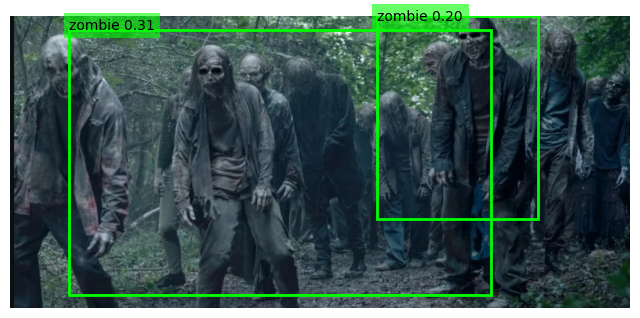

(array([[ 128,   32, 1043,  607],
        [ 797,    0, 1145,  442]]),
 array([0, 0], dtype=int32),
 array([0.312648  , 0.20112538], dtype=float32))

In [91]:
predict_img("new_t1.jpg", model, score_th=0.2, iou_th=0.2)

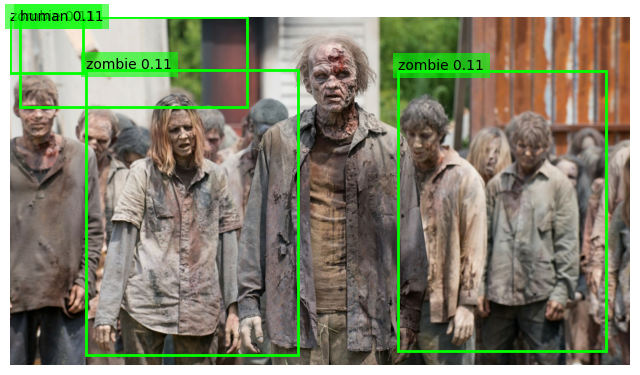

(array([[   0,    0,  187,  144],
        [ 195,  135,  736,  867],
        [ 994,  138, 1525,  855],
        [  25,    0,  607,  230]]),
 array([0, 0, 0, 1], dtype=int32),
 array([0.10954034, 0.10923956, 0.10882979, 0.11447088], dtype=float32))

In [50]:
predict_img("test_zom/2_t.jpg", model_yolo, score_th=0.10, iou_th=0.0001)

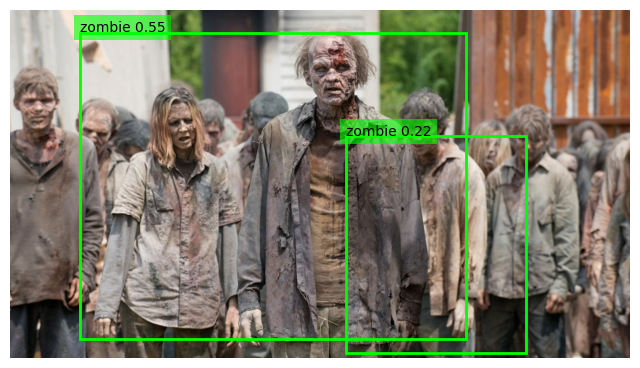

(array([[ 178,   59, 1167,  843],
        [ 860,  324, 1322,  879]]),
 array([0, 0], dtype=int32),
 array([0.55129975, 0.21856253], dtype=float32))

In [87]:
predict_img("test_zom/2_t.jpg", model, score_th=0.2, iou_th=0.2)

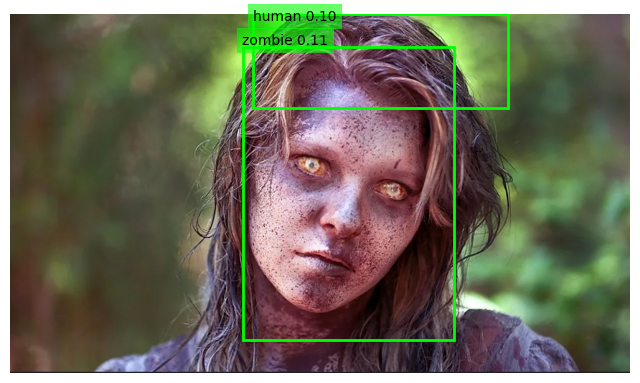

(array([[373,  52, 712, 523],
        [390,   0, 799, 151]]),
 array([0, 1], dtype=int32),
 array([0.11070911, 0.10187498], dtype=float32))

In [52]:
predict_img("test_zom/1_t.jpg", model_yolo, score_th=0.1, iou_th= 0.1)

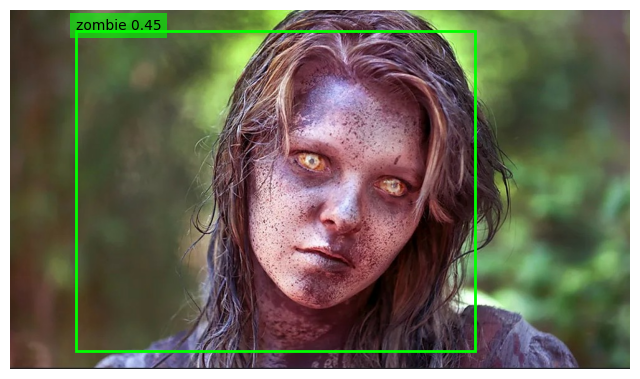

(array([[105,  34, 747, 548]]),
 array([0], dtype=int32),
 array([0.4549412], dtype=float32))

In [51]:
predict_img("test_zom/1_t.jpg", model, score_th=0.4)

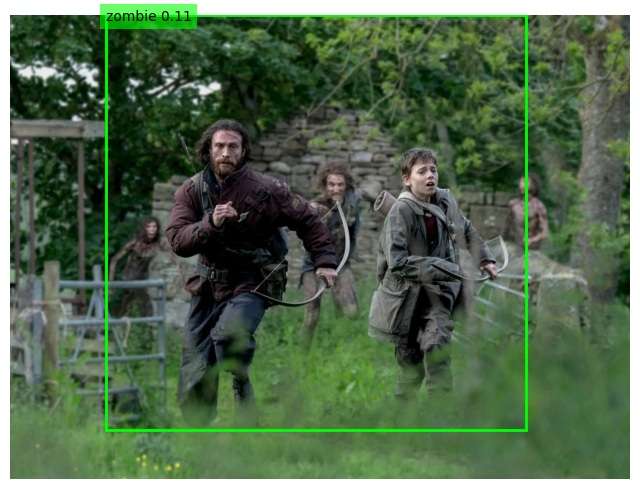

(array([[184,   0, 992, 798]]),
 array([0], dtype=int32),
 array([0.11350881], dtype=float32))

In [59]:
predict_img("test_zom/4_t.jpg", model_yolo, score_th=0.1, iou_th= 0.1)

As we compared both RetinaNet and YoloV8 above for some test images we can see that bounding boxes too are all over the place for yolo model, and it is due to lack of data as YoloV8 need more data compared to RetinaNet to be effective.

In [60]:
# -------- Helpers to unpack predictions from KerasCV models (ragged or dense) --------
def unpack_predictions(preds, score_min=0.0):
    boxes_out, classes_out, scores_out = [], [], []
    boxes = preds["boxes"]; classes = preds["classes"]; scores = preds["confidence"]
    # Dense padded
    if isinstance(classes, (tf.Tensor, np.ndarray)):
        c = classes.numpy() if isinstance(classes, tf.Tensor) else classes
        s = scores.numpy()  if isinstance(scores,  tf.Tensor) else scores
        b = boxes.numpy()   if isinstance(boxes,   tf.Tensor) else boxes
        B = c.shape[0]
        for i in range(B):
            valid = (c[i] != -1) & (s[i] >= score_min)
            boxes_out.append(b[i][valid])
            classes_out.append(c[i][valid].astype(int))
            scores_out.append(s[i][valid])
        return boxes_out, classes_out, scores_out
    # Ragged
    B = classes.shape[0]
    for i in range(B):
        ci = classes[i].numpy().astype(int)
        si = scores[i].numpy()
        bi = boxes[i].numpy()
        keep = si >= score_min
        boxes_out.append(bi[keep])
        classes_out.append(ci[keep])
        scores_out.append(si[keep])
    return boxes_out, classes_out, scores_out

# -------- IoU and AP computations --------
def iou_xyxy(box, boxes):
    # box: (4,), boxes: (N,4) in rel_xyxy
    x1 = np.maximum(box[0], boxes[:, 0]); y1 = np.maximum(box[1], boxes[:, 1])
    x2 = np.minimum(box[2], boxes[:, 2]); y2 = np.minimum(box[3], boxes[:, 3])
    inter = np.maximum(0.0, x2 - x1) * np.maximum(0.0, y2 - y1)
    area1 = np.maximum(0.0, box[2]-box[0]) * np.maximum(0.0, box[3]-box[1])
    area2 = np.maximum(0.0, boxes[:,2]-boxes[:,0]) * np.maximum(0.0, boxes[:,3]-boxes[:,1])
    union = np.maximum(area1 + area2 - inter, 1e-12)
    return inter / union

def precision_recall_from_detections(detections, npos):
    # detections: list of (score, is_tp) for one class across dataset
    # Returns precisions, recalls, scores (sorted by score desc)
    if len(detections) == 0 or npos == 0:
        return np.array([1.0]), np.array([0.0]), np.array([0.0])
    detections.sort(key=lambda x: x[0], reverse=True)
    scores = np.array([d[0] for d in detections], dtype=np.float32)
    is_tp  = np.array([1 if d[1] else 0 for d in detections], dtype=np.int32)
    tp = np.cumsum(is_tp)
    fp = np.cumsum(1 - is_tp)
    recalls = tp / (npos + 1e-12)
    precisions = tp / np.maximum(tp + fp, 1e-12)
    return precisions, recalls, scores

def ap_from_pr(precisions, recalls):
    # VOC-style interpolation then integrate
    if precisions.size == 0:
        return 0.0
    # Make precision non-increasing
    p = precisions.copy()
    for i in range(len(p)-2, -1, -1):
        p[i] = max(p[i], p[i+1])
    # Integrate via trapezoidal rule over recall
    r = recalls
    # Ensure starting at 0 and ending at 1 for stable integration (optional)
    r2 = np.concatenate([[0.0], r, [1.0]])
    p2 = np.concatenate([[p[0]], p, [0.0]])
    ap = np.trapz(p2, r2)
    return float(ap)

# -------- mAP50 evaluator with PR curves --------
def evaluate_map50_and_pr(model, dataset, num_classes, class_names=None, iou_thresh=0.50, score_min=0.0):
    # Make decoder permissive; we will filter by score_min (ensures consistent behavior)
    if hasattr(model, "prediction_decoder"):
        try: model.prediction_decoder.confidence_threshold = 0.0
        except: pass
        try: model.prediction_decoder.pad_to_max_detections = False
        except: pass
        # keep model's own NMS IoU as-is

    per_class_dets = [[] for _ in range(num_classes)]  # list of (score, is_tp)
    per_class_npos = np.zeros(num_classes, dtype=int)

    # Loop over dataset once (ensure dataset_test has no .repeat())
    for batch in dataset:
        images = batch["images"]
        y_true = batch["bounding_boxes"]
        gt_boxes_b = y_true["boxes"].numpy()           # [B, MAX, 4] rel_xyxy
        gt_classes_b = y_true["classes"].numpy()       # [B, MAX]

        preds = model.predict(images, verbose=0)
        pred_boxes_list, pred_classes_list, pred_scores_list = unpack_predictions(preds, score_min=score_min)

        B = images.shape[0]
        for i in range(B):
            # Ground-truth for image i
            valid_gt = gt_classes_b[i] >= 0
            gt_boxes = gt_boxes_b[i][valid_gt]
            gt_cls = gt_classes_b[i][valid_gt].astype(int)
            # Count positives per class
            for c in range(num_classes):
                per_class_npos[c] += int(np.sum(gt_cls == c))

            # Predictions for image i
            pb = pred_boxes_list[i]
            pc = pred_classes_list[i]
            ps = pred_scores_list[i]

            # For each class: match preds to GT via greedy IoU >= iou_thresh
            for c in range(num_classes):
                det_idx = np.where(pc == c)[0]
                if det_idx.size == 0:
                    continue
                boxes_c = pb[det_idx]
                scores_c = ps[det_idx]
                order = np.argsort(-scores_c)
                boxes_c = boxes_c[order]; scores_c = scores_c[order]

                gt_idx = np.where(gt_cls == c)[0]
                gt_boxes_c = gt_boxes[gt_idx]
                matched = np.zeros(len(gt_boxes_c), dtype=bool)

                for k in range(len(boxes_c)):
                    if len(gt_boxes_c) == 0:
                        per_class_dets[c].append((float(scores_c[k]), False))
                        continue
                    ious = iou_xyxy(boxes_c[k], gt_boxes_c)
                    j = int(np.argmax(ious))
                    if ious[j] >= iou_thresh and not matched[j]:
                        matched[j] = True
                        per_class_dets[c].append((float(scores_c[k]), True))
                    else:
                        per_class_dets[c].append((float(scores_c[k]), False))

    # Build PR curves and AP per class
    pr_curves = {}
    ap_per_class = np.zeros(num_classes, dtype=np.float32)
    for c in range(num_classes):
        precisions, recalls, scores = precision_recall_from_detections(per_class_dets[c], per_class_npos[c])
        ap = ap_from_pr(precisions, recalls)
        ap_per_class[c] = ap
        pr_curves[c] = {"precision": precisions, "recall": recalls, "scores": scores}

    # mAP50 (mean over classes with GT)
    valid = per_class_npos > 0
    mAP50 = float(np.mean(ap_per_class[valid])) if np.any(valid) else float("nan")

    # Pretty dict of APs
    if class_names is None:
        class_names = [f"class_{i}" for i in range(num_classes)]
    ap_dict = {class_names[i]: float(ap_per_class[i]) for i in range(num_classes)}

    return {
        "mAP50": mAP50,
        "AP50_per_class": ap_dict,
        "pr_curves": pr_curves,
        "npos_per_class": per_class_npos,
    }

# -------- Plot overlayed PR curves (YOLO vs Retina) --------
def plot_pr_curves_compare(curves_a, curves_b, class_names, label_a="YOLO", label_b="RetinaNet"):
    C = len(class_names)
    cols = min(2, C)
    rows = int(np.ceil(C / cols))
    plt.figure(figsize=(6*cols, 5*rows))
    for c in range(C):
        ax = plt.subplot(rows, cols, c+1)
        pa = curves_a[c]["precision"]; ra = curves_a[c]["recall"]
        pb = curves_b[c]["precision"]; rb = curves_b[c]["recall"]
        ax.plot(ra, pa, label=label_a)
        ax.plot(rb, pb, label=label_b)
        ax.set_xlabel("Recall")
        ax.set_ylabel("Precision")
        ax.set_title(f"PR: {class_names[c]}")
        ax.set_xlim(0, 1); ax.set_ylim(0, 1)
        ax.grid(True, ls="--", alpha=0.4)
        ax.legend()
    plt.tight_layout()
    plt.show()


2025-09-22 18:47:48.669330: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
/tmp/ipykernel_138893/798095958.py:67: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ap = np.trapz(p2, r2)
/home/anubh/miniconda3/envs/dl-env/lib/python3.11/site-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(4, 512, 512, 3))
  warnings.warn(msg)
2025-09-22 18:47:53.558284: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:310] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.18GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
/home/anubh/miniconda3/envs/dl-env/lib/python3.11/site-p

YOLO  mAP@0.50: 0.022618113085627556  AP per class: {'zombie': 0.03450390323996544, 'human': 0.010732322931289673}
Retina mAP@0.50: 0.4160708785057068  AP per class: {'zombie': 0.3321417272090912, 'human': 0.5}


2025-09-22 18:48:04.733255: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
/tmp/ipykernel_138893/798095958.py:67: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ap = np.trapz(p2, r2)


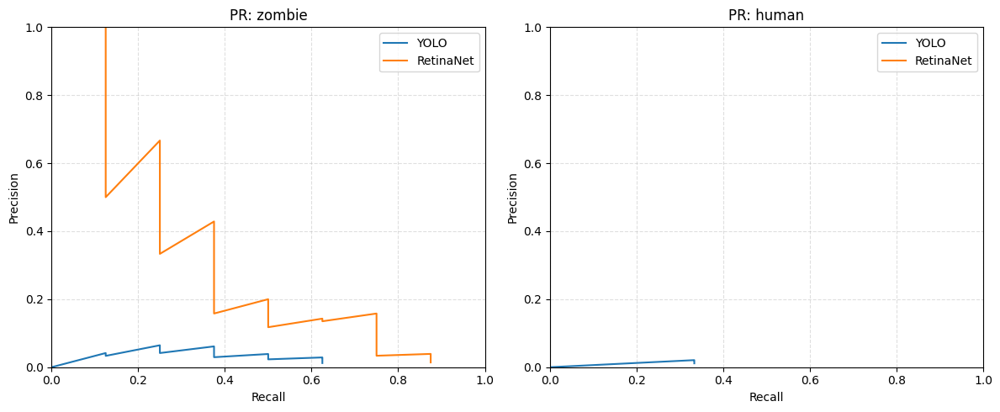

In [61]:
class_names = ["zombie", "human"]
num_classes = 2

yolo_res = evaluate_map50_and_pr(model_yolo, dataset_test, num_classes, class_names, iou_thresh=0.50, score_min=0.0)
ret_res  = evaluate_map50_and_pr(model, dataset_test, num_classes, class_names, iou_thresh=0.50, score_min=0.0)

print("YOLO  mAP@0.50:", yolo_res["mAP50"], " AP per class:", yolo_res["AP50_per_class"])
print("Retina mAP@0.50:", ret_res["mAP50"], " AP per class:", ret_res["AP50_per_class"])

plot_pr_curves_compare(yolo_res["pr_curves"], ret_res["pr_curves"], class_names,
                       label_a="YOLO", label_b="RetinaNet")


mAP of RetinaNet is much better than YoloV8, gap between them is around 200 times which is a very massive difference and while in some visual inspections we can indeed see the human class detection in YoloV8 from the class Average Precision we can see that it was most probably entirely random. And, while RetinaNet was not that good in human detection, it was most likely because of data limitation, we should have focused specifically on zombies or get more samples for human classes, currently only 4-5 images were there for this class which limited the learning. 

## Conclusion

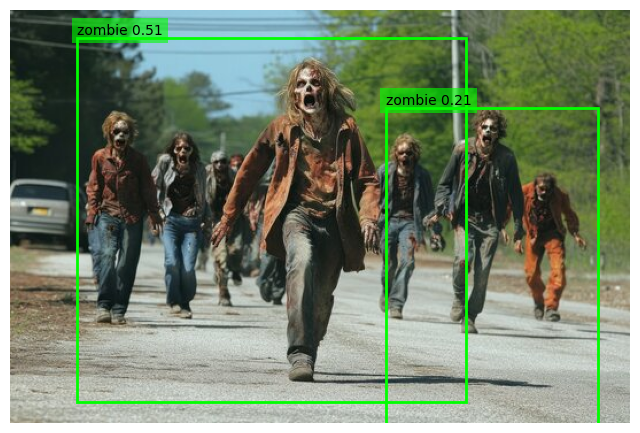

(array([[ 58,  24, 397, 341],
        [327,  85, 512, 360]]),
 array([0, 0], dtype=int32),
 array([0.506866 , 0.2065899], dtype=float32))

In [66]:
predict_img("new_t2.jpg", model, score_th=0.2, iou_th=0.15)

We tested entirely random image from internet and we indeed got decent bounding boxes and classes for zombies. RetinaNet performed exceptionally well compared to YoloV8 with our 26 training images sample, and by using more data we can improve performance of both models. We can also improve the human class detection by getting more samples for them but this is out of the scope of this project right now, but we can revisit the project later and use more samples with ViT or Vision Transformers in mix as backbone.

We can also improve the finetuning by extending it to whole backbone using full finetuning or Parameter Efficient Fine Tuning techniques like LoRA and QLoRA.

Overall, in this project we created a competent full end to end pipeline for object detection, from sourcing images to annotating them manually, to using Keras-CV to finetune two of the most leading object detection algorithm. While our best detector, RetinaNet, is not able to differentiate much between Zombies and Humans, it may still be a good model in a Zommbie Apocalypse where humans can be more dangerous than Zombies.